# Batch correction using MNN

I will perform batch correction using MNN in the same way as in the original atlas, with minor modifications: <br>
    - First round will be performed within stages, for each dataset seperately. Since Qiu's data doesn't have samples will skip this here<br>
    - Second round between stages<br>
I will inspect if this already gives enough correction between the two datasets
If not, I will do: <br>
    - Third round between the three datasets

In [1]:
# Load packages
suppressPackageStartupMessages({
    library(data.table)
    library(Matrix)
    library(dplyr)
    library(SingleCellExperiment)
    library(batchelor)
    library(scuttle)
    library(scater)
    library(scran)
    library(ggplot2)
    library(BiocParallel)
    library(ggpubr)
    library(ggrepel)
    library(destiny)
})

ncores = 8
mcparam = SnowParam(workers = ncores)


minmax.normalisation <- function(x)
{
    return((x-min(x,na.rm=T)) /(max(x,na.rm=T)-min(x,na.rm=T)))
}

Warning message:
“package ‘destiny’ was built under R version 4.1.3”


In [2]:
blood = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid'

source(file.path(blood, '00_Utils.R'))



### MNN set up

In [16]:
meta = fread( file.path(blood, 'meta.txt.gz'))

In [17]:
meta = meta %>%
    .[,`:=`(stage = ifelse(stage=='E8.5b', 'E8.5', stage),
           stage_dataset = paste0(stage,'_', dataset))]

In [18]:
# celltype color pallette
celltype_pallet = ArchRPalettes$stallion2[1:length(unique(meta$celltype))]
names(celltype_pallet) = unique(meta$celltype)

In [19]:
table(meta$stage, meta$dataset) 
# E8.5 is shared by all three
# use E8.5 and E9.5 to verify if batch correction works well

       
        Extension Original   qiu
  E10.5         0        0 14246
  E11.5         0        0 19161
  E12.5         0        0 11240
  E13.5         0        0 14082
  E6.75         0        3     0
  E7.0          0      356     0
  E7.25         0      377     0
  E7.5          0      938     0
  E7.75         0     2316     0
  E8.0          0     3555     0
  E8.25         0     2455     0
  E8.5       8269     3796  8095
  E8.75     10482        0     0
  E9.0      10503        0     0
  E9.25     14092        0     0
  E9.5       6842        0  6866

In [16]:
table(meta$stage_dataset, meta$dataset)

                 
                  Extension Original   qiu
  E10.5_qiu               0        0 14246
  E11.5_qiu               0        0 19161
  E12.5_qiu               0        0 11240
  E13.5_qiu               0        0 14082
  E6.75_Original          0        3     0
  E7.0_Original           0      356     0
  E7.25_Original          0      377     0
  E7.5_Original           0      938     0
  E7.75_Original          0     2316     0
  E8.0_Original           0     3555     0
  E8.25_Original          0     2455     0
  E8.5_Extension       8269        0     0
  E8.5_Original           0     3796     0
  E8.5b_qiu               0        0  8095
  E8.75_Extension     10482        0     0
  E9.0_Extension      10503        0     0
  E9.25_Extension     14092        0     0
  E9.5_Extension       6842        0     0
  E9.5_qiu                0        0  6866

In [17]:
sce = readRDS(file.path(blood, 'sce.rds'))

In [18]:
colData(sce) = meta[match(colnames(sce), meta$cell)] %>% 
                        as.data.frame %>% 
                        tibble::column_to_rownames("cell") %>%
                        .[colnames(sce),] %>% DataFrame()

In [19]:
head(meta)
head(sce)

cell,sample,stage,celltype,dataset,stage_dataset
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
cell_363,2,E7.5,Blood progenitors,Original,E7.5_Original
cell_382,2,E7.5,Blood progenitors,Original,E7.5_Original
cell_385,2,E7.5,Blood progenitors,Original,E7.5_Original
cell_393,2,E7.5,Blood progenitors,Original,E7.5_Original
cell_398,2,E7.5,Blood progenitors,Original,E7.5_Original
cell_407,2,E7.5,Haematoendothelial progenitors,Original,E7.5_Original


class: SingleCellExperiment 
dim: 6 137674 
metadata(0):
assays(3): counts logcounts cosineNorm
rownames(6): ENSMUSG00000051951 ENSMUSG00000025900 ...
  ENSMUSG00000025903 ENSMUSG00000104217
rowData names(0):
colnames(137674): cell_363 cell_382 ... sci3-me-758.AGTTGCGCTAATTAAGACT
  sci3-me-760.TTCGCGGATAATTAAGACT
colData names(5): sample stage celltype dataset stage_dataset
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [20]:
# Detect HVGs, per dataset
genes = getHVGs(sce, block=colData(sce)$dataset)

In [21]:
# Multi batch PCA per dataset
big_pca = multiBatchPCA(
sce,
batch = sce$dataset,
subset.row = genes,
d = 35,
preserve.single = TRUE,
assay.type = "cosineNorm"
)[[1]]
rownames(big_pca) = colnames(sce) 

# No idea why it prints TRUE?? 

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [15] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [29] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [43] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [57] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [71] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [85] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [99] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [113] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [127] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [141] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [155] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [169] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [183] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [197] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [211] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [225] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [239] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [253] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [267] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [281] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [295] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [309] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [323] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [337] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [351] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [365] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [379] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [393] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [407] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [421] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [435] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [449] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [463] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [477] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [491] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [505] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [519] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [533] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [547] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [561] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [575] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [589] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [603] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [617] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [631] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [645] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [659] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [673] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [687] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [701] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [715] TRUE TRUE TRUE TRU

In [22]:
## Stage correction within datasets
# Order samples within stage_dataset from most to fewest cells
order_df        <- meta[!duplicated(meta$sample), c("stage_dataset", "sample")]
order_df$ncells <- sapply(order_df$sample, function(x) sum(meta$sample == x))
order_df       <- order_df[order(order_df$stage_dataset, order_df$ncells, decreasing = TRUE),]
order_df$stage_dataset <- as.character(order_df$stage_dataset) 

#create nested list
pc_list    <- lapply(unique(meta$stage_dataset), function(tp){
sub_pc   <- big_pca[meta$stage_dataset == tp, , drop = FALSE]
sub_samp <- meta$sample[meta$stage_dataset == tp]
list     <- lapply(unique(sub_samp), function(samp){
  sub_pc[sub_samp == samp, , drop = FALSE]
})
names(list) <- unique(sub_samp)
return(list)
})

names(pc_list) <- unique(meta$stage_dataset)                          


In [23]:
# Correct within each stage dataset
correct_list <- lapply(pc_list, function(x){
    if(length(x) > 1){
        #return(do.call(scran::fastMNN, c(x, "pc.input" = TRUE, BPPARAM = BPPARAM))$corrected)
        return(do.call(reducedMNN, c(x, BPPARAM = mcparam))$corrected) # edited 09.02. because of "Error: 'fastMNN' is not an exported object from 'namespace:scran'", 17.02. changed to reducedMNN because otherwise it thinks PCA space is logcounts which would be utter bullcrap
    } else {
      return(x[[1]])
    }
  })

Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”


In [24]:
# Check if this also automatically corrects for dataset batch effects
# Re-order correct_list from large to small 
order_list = rev(sort(sapply(correct_list, nrow)))
correct_list = correct_list[names(order_list)]
correct = do.call(reducedMNN, c(correct_list, BPPARAM = mcparam))$corrected

correct = correct[match(colnames(sce), rownames(correct)),]

reducedDim(sce, "PCA_sample_stagedataset") = correct

sce <- runUMAP(sce, dimred="PCA_sample_stagedataset", n_neighbors = 40, min_dist = 0.3, name='UMAP_sample_stagedataset')

Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”


In [25]:
saveRDS(sce, file.path(blood, 'sce_integrated.rds'))

In [7]:
sce = readRDS(file.path(blood, 'sce_integrated.rds'))

In [8]:
# Add gene names
genes = fread('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Mmusculus_genes_BioMart.87.txt')
rownames(sce) = genes[match(rownames(sce), genes$ens_id), symbol] 

# # minmax normalisation of genes within datasets
# logcounts = logcounts(sce)
# logcounts_minmax = lapply(unique(meta$dataset), function(x){ # 
#     #x = "Original"
#     cells = meta[dataset==x, cell]
#     logcounts_tmp = logcounts[,cells]
#     norm_logcounts = t(apply(logcounts_tmp, 1, minmax.normalisation))
#     return(norm_logcounts)
# })
# logcounts_minmax = as(do.call('cbind', logcounts_minmax), "sparseMatrix")
# logcounts_minmax = logcounts_minmax[,match(colnames(sce), colnames(logcounts_minmax))]

# assay(sce, "logcounts_minmax") = logcounts_minmax

In [9]:
head(sce)

class: SingleCellExperiment 
dim: 6 137674 
metadata(0):
assays(3): counts logcounts cosineNorm
rownames(6): Xkr4 Rp1 ... Lypla1 Gm37988
rowData names(0):
colnames(137674): cell_363 cell_382 ... sci3-me-758.AGTTGCGCTAATTAAGACT
  sci3-me-760.TTCGCGGATAATTAAGACT
colData names(5): sample stage celltype dataset stage_dataset
reducedDimNames(2): PCA_sample_stagesample UMAP_sample_stagesample
mainExpName: RNA
altExpNames(0):

In [10]:

umap.dt <- reducedDim(sce,"UMAP_sample_stagedataset") %>% as.data.table(keep.rownames=T) %>% 
  setnames(c("cell","UMAP1","UMAP2")) %>%
    merge(meta, by='cell')

umap.dt$stage_cont = as.numeric(gsub('E', '', umap.dt$stage))

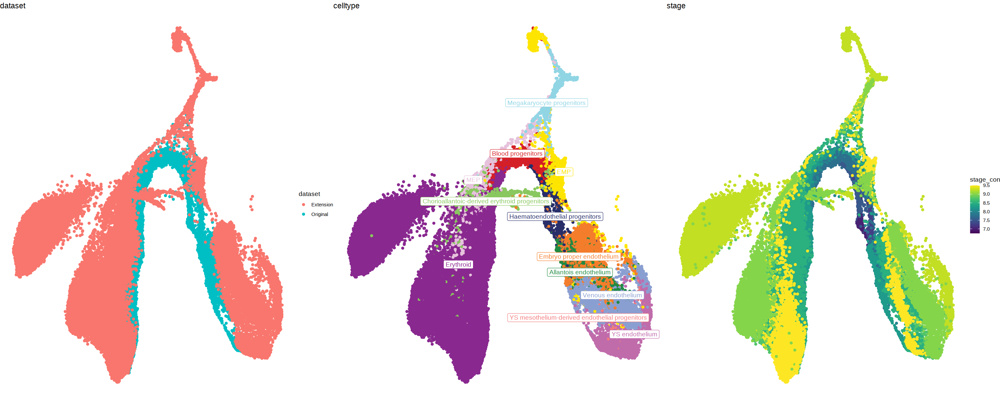

In [11]:
p1 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=dataset)) + 
    geom_point() + 
    ggtitle('dataset') + 
    theme_void() 

labels = umap.dt %>% 
    .[,`:=`(medianX=median(UMAP1), medianY=median(UMAP2)), by='celltype'] %>%
    unique(by='celltype')

p2 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=celltype)) + 
    geom_point() + 
    scale_colour_manual(values = celltype_pallet) + 
    geom_label_repel(data=labels, 
                             aes(medianX, medianY, label=celltype),
                            #col='black',
                            size=4,
                            max.overlaps=Inf) +
    ggtitle('celltype') + 
    theme_void() + theme(legend.position='none')

p3 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=stage_cont)) + 
    geom_point() + 
    viridis::scale_color_viridis() + 
    ggtitle('stage') + 
    theme_void() 

options(repr.plot.width=25, repr.plot.height=10) 
ggarrange(p1,p2,p3, ncol=3)

In [12]:
# Gene lists
genes1 = c('Bcl11a',
           'Bcl11b',
           'Lyve1',
           'Fxyd6')
haem_embryonic = c('Hba-x', 
               'Hbb-bh1',
               'Hbb-y')
haem_adult = c('Hbb-bs',
               'Hbb-bt',
               'Hba-a1',
               'Hba-a2')
blood = c('Itga2b',  # Cd41
          'Ptprc', # Cd45
          'Kit', # cKit
          'Cdh5',
          'Pecam1',
          'Runx1',
          'Gata2')


In [13]:
head(sce)

class: SingleCellExperiment 
dim: 6 137674 
metadata(0):
assays(3): counts logcounts cosineNorm
rownames(6): Xkr4 Rp1 ... Lypla1 Gm37988
rowData names(0):
colnames(137674): cell_363 cell_382 ... sci3-me-758.AGTTGCGCTAATTAAGACT
  sci3-me-760.TTCGCGGATAATTAAGACT
colData names(5): sample stage celltype dataset stage_dataset
reducedDimNames(2): PCA_sample_stagesample UMAP_sample_stagesample
mainExpName: RNA
altExpNames(0):

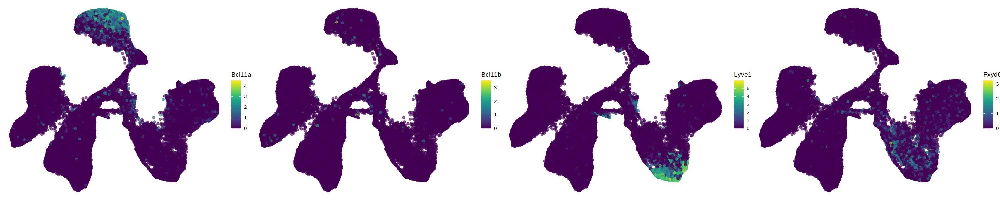

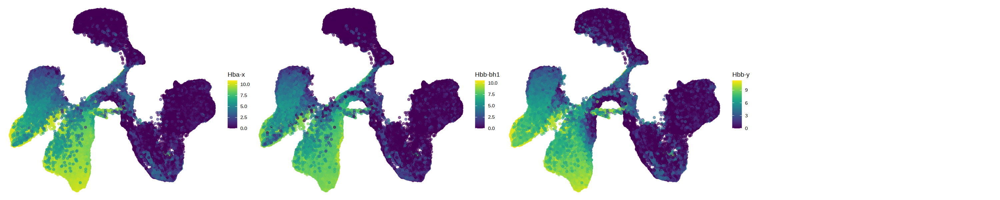

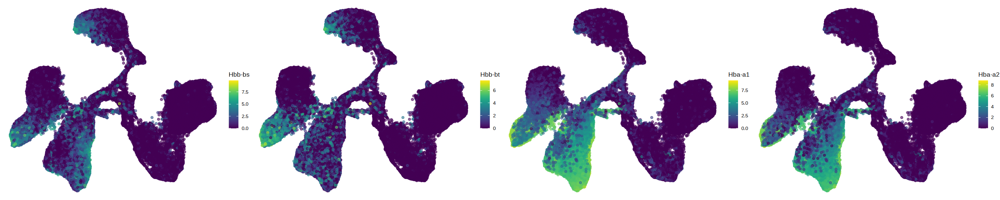

$`1`

$`2`

attr(,"class")
[1] "list"      "ggarrange"

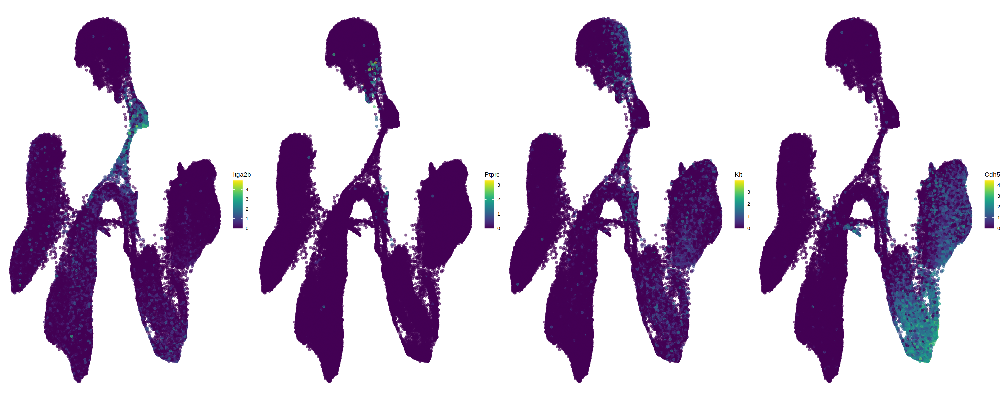

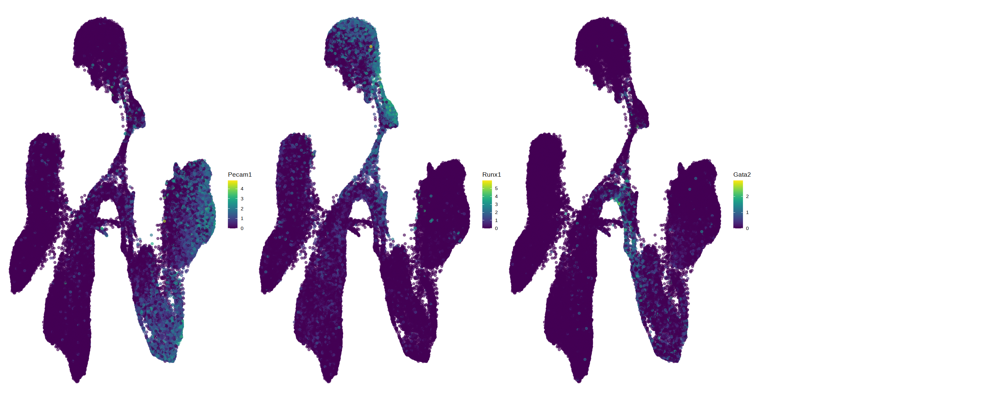

In [14]:
options(repr.plot.width=25, repr.plot.height=5) 
ggarrange(plotlist=lapply(genes1, function(x){plotReducedDim(sce, dimred='UMAP_sample_stagedataset', by_exprs_values= 'logcounts', colour_by=x) + theme_void()}), ncol=4)
ggarrange(plotlist=lapply(haem_embryonic, function(x){plotReducedDim(sce, dimred='UMAP_sample_stagedataset', by_exprs_values= 'logcounts', colour_by=x) + theme_void()}), ncol=4)
ggarrange(plotlist=lapply(haem_adult, function(x){plotReducedDim(sce, dimred='UMAP_sample_stagedataset', by_exprs_values= 'logcounts', colour_by=x) + theme_void()}), ncol=4)
options(repr.plot.width=25, repr.plot.height=10) 
ggarrange(plotlist=lapply(blood, function(x){plotReducedDim(sce, dimred='UMAP_sample_stagedataset', by_exprs_values= 'logcounts', colour_by=x) + theme_void()}), ncol=4)

In [ ]:
# Diffusion maps
dm <- DiffusionMap(reducedDim(sce, "PCA_sample_stagedataset"), n_pcs=35)
# Add to the SingleCellExperiment object
reducedDim(sce, "DM_sample_stagedataset") <- dm@eigenvectors[,c(1,2)]

In [ ]:
umap.dt <- reducedDim(sce,"DM_sample_stagedataset") %>% as.data.table(keep.rownames=T) %>% 
  setnames(c("cell","UMAP1","UMAP2")) %>%
    merge(meta, by='cell')

umap.dt$stage_cont = as.numeric(gsub('E', '', umap.dt$stage))

In [ ]:
p1 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=dataset)) + 
    geom_point() + 
    ggtitle('dataset') + 
    theme_void() 

labels = umap.dt %>% 
    .[,`:=`(medianX=median(UMAP1), medianY=median(UMAP2)), by='celltype'] %>%
    unique(by='celltype')

p2 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=celltype)) + 
    geom_point() + 
    scale_colour_manual(values = celltype_pallet) + 
    geom_label_repel(data=labels, 
                             aes(medianX, medianY, label=celltype),
                            #col='black',
                            size=4,
                            max.overlaps=Inf) +
    ggtitle('celltype') + 
    theme_void() + theme(legend.position='none')

p3 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=stage_cont)) + 
    geom_point() + 
    viridis::scale_color_viridis() + 
    ggtitle('stage') + 
    theme_void() 

options(repr.plot.width=25, repr.plot.height=10) 
ggarrange(p1,p2,p3, ncol=3)

### Batch correct datasets

In [17]:
# Correct between the datasets, with the previous corrected PCAs as input
# note: this is agnostic of the E8.5 and E9.5 anchor points between the datasets
correct = reducedDim(sce, "PCA_sample_stagedataset")

pc_list    <- lapply(unique(meta$dataset), function(ds){
    sub_pc   <- correct[meta$dataset == ds, , drop = FALSE]
    return(sub_pc)
})
names(pc_list) <- unique(meta$dataset)      

order_list = rev(sort(sapply(pc_list, nrow)))
pc_list = pc_list[names(order_list)]

correct = do.call(reducedMNN, c(pc_list, BPPARAM = mcparam))$corrected


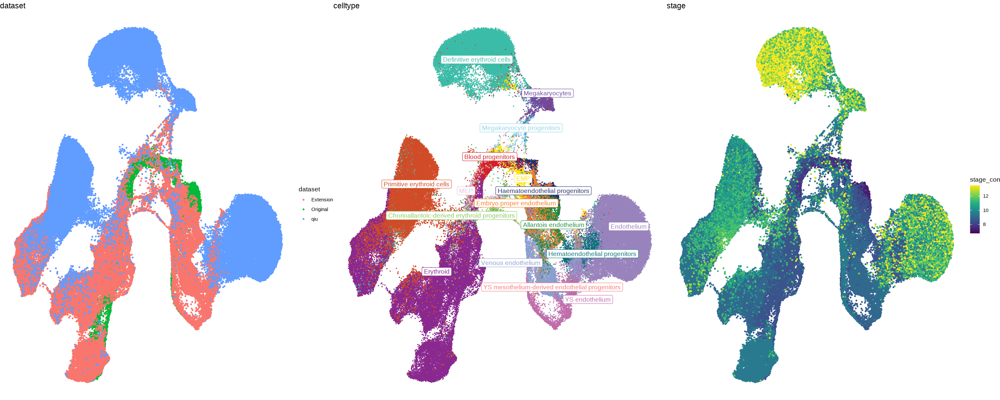

In [18]:

correct = correct[match(colnames(sce), rownames(correct)),]

reducedDim(sce, "PCA_sample_stagesample_dataset") = correct

sce <- runUMAP(sce, dimred="PCA_sample_stagedataset_dataset", n_neighbors = 40, min_dist = 0.3, name='PCA_sample_stagedataset_dataset')

umap.dt <- reducedDim(sce,"PCA_sample_stagedataset_dataset") %>% as.data.table(keep.rownames=T) %>% 
  setnames(c("cell","UMAP1","UMAP2")) %>%
    merge(meta, by='cell')

umap.dt$stage_cont = as.numeric(gsub('E', '', umap.dt$stage))

p1 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=dataset)) + 
    geom_point(size=0.5) + 
    ggtitle('dataset') + 
    theme_void() 

labels = umap.dt %>% 
    .[,`:=`(medianX=median(UMAP1), medianY=median(UMAP2)), by='celltype'] %>%
    unique(by='celltype')

p2 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=celltype)) + 
    geom_point(size=0.) + 
    scale_colour_manual(values = celltype_pallet) + 
    geom_label_repel(data=labels, 
                             aes(medianX, medianY, label=celltype),
                            #col='black',
                            size=4,
                            max.overlaps=Inf) +
    ggtitle('celltype') + 
    theme_void() + theme(legend.position='none')

p3 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=stage_cont)) + 
    geom_point(size=0.5) + 
    viridis::scale_color_viridis() + 
    ggtitle('stage') + 
    theme_void() 

options(repr.plot.width=25, repr.plot.height=10) 
ggarrange(p1,p2,p3, ncol=3)

# Batch correction without separating datasets per stage

In [ ]:
# sce = multiBatchNorm(sce, batch=as.factor(sce$dataset))

In [7]:
sce = readRDS(file.path(blood, 'sce.rds'))

In [14]:
sce

class: SingleCellExperiment 
dim: 12203 137674 
metadata(0):
assays(3): counts logcounts cosineNorm
rownames(12203): ENSMUSG00000051951 ENSMUSG00000025900 ...
  ENSMUSG00000064368 ENSMUSG00000064370
rowData names(0):
colnames(137674): cell_363 cell_382 ... sci3-me-758.AGTTGCGCTAATTAAGACT
  sci3-me-760.TTCGCGGATAATTAAGACT
colData names(5): sample stage celltype dataset sizeFactor
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [21]:
colData(sce) = meta[match(colnames(sce), meta$cell)] %>% 
                        as.data.frame %>% 
                        tibble::column_to_rownames("cell") %>%
                        .[colnames(sce),] %>% DataFrame()

In [22]:
# Detect HVGs, per dataset
genes = getHVGs(sce, block=colData(sce)$dataset)

In [24]:
length(genes)

[1] 982

In [25]:
# Multi batch PCA per dataset
big_pca = multiBatchPCA(
sce,
batch = sce$dataset,
subset.row = genes,
d = 35,
preserve.single = TRUE,
assay.type = "cosineNorm"
)[[1]]
rownames(big_pca) = colnames(sce) 

# No idea why it prints TRUE?? 

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [15] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [29] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [43] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [57] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [71] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [85] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
   [99] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [113] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [127] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [141] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [155] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [169] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [183] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [197] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [211] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [225] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [239] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [253] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [267] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [281] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [295] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [309] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [323] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [337] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [351] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [365] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [379] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [393] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [407] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [421] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [435] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [449] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [463] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [477] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [491] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [505] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [519] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [533] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [547] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [561] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [575] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [589] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [603] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [617] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [631] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [645] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [659] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [673] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [687] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [701] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
  [715] TRUE TRUE TRUE TRU

In [28]:
## Stage correction within datasets
# Order samples within stage_dataset from most to fewest cells
order_df        <- meta[!duplicated(meta$sample), c("stage", "sample")]
order_df$ncells <- sapply(order_df$sample, function(x) sum(meta$sample == x))
order_df       <- order_df[order(order_df$stage, order_df$ncells, decreasing = TRUE),]
order_df$stage <- as.character(order_df$stage) 

#create nested list
pc_list    <- lapply(unique(meta$stage), function(tp){
sub_pc   <- big_pca[meta$stage == tp, , drop = FALSE]
sub_samp <- meta$sample[meta$stage == tp]
list     <- lapply(unique(sub_samp), function(samp){
  sub_pc[sub_samp == samp, , drop = FALSE]
})
names(list) <- unique(sub_samp)
return(list)
})

names(pc_list) <- unique(meta$stage)                          


In [30]:
# Correct within each stage dataset
correct_list <- lapply(pc_list, function(x){
    if(length(x) > 1){
        #return(do.call(scran::fastMNN, c(x, "pc.input" = TRUE, BPPARAM = BPPARAM))$corrected)
        return(do.call(reducedMNN, c(x, BPPARAM = mcparam))$corrected) # edited 09.02. because of "Error: 'fastMNN' is not an exported object from 'namespace:scran'", 17.02. changed to reducedMNN because otherwise it thinks PCA space is logcounts which would be utter bullcrap
    } else {
      return(x[[1]])
    }
  })

Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”


In [31]:
# Check if this also automatically corrects for dataset batch effects
# Re-order correct_list from large to small 
order_list = rev(sort(sapply(correct_list, nrow)))
correct_list = correct_list[names(order_list)]
correct = do.call(reducedMNN, c(correct_list, BPPARAM = mcparam))$corrected

correct = correct[match(colnames(sce), rownames(correct)),]

reducedDim(sce, "PCA_sample_stage") = correct

sce <- runUMAP(sce, dimred="PCA_sample_stage", n_neighbors = 40, min_dist = 0.3, name='UMAP_sample_stage')

Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”


In [25]:
saveRDS(sce, file.path(blood, 'sce_integrated.rds'))

In [7]:
sce = readRDS(file.path(blood, 'sce_integrated.rds'))

In [34]:
# Add gene names
genes = fread('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Mmusculus_genes_BioMart.87.txt')
rownames(sce) = genes[match(rownames(sce), genes$ens_id), symbol] 

# # minmax normalisation of genes within datasets
# logcounts = logcounts(sce)
# logcounts_minmax = lapply(unique(meta$dataset), function(x){ # 
#     #x = "Original"
#     cells = meta[dataset==x, cell]
#     logcounts_tmp = logcounts[,cells]
#     norm_logcounts = t(apply(logcounts_tmp, 1, minmax.normalisation))
#     return(norm_logcounts)
# })
# logcounts_minmax = as(do.call('cbind', logcounts_minmax), "sparseMatrix")
# logcounts_minmax = logcounts_minmax[,match(colnames(sce), colnames(logcounts_minmax))]

# assay(sce, "logcounts_minmax") = logcounts_minmax

In [35]:
head(sce)

class: SingleCellExperiment 
dim: 6 137674 
metadata(0):
assays(3): counts logcounts cosineNorm
rownames(6): Xkr4 Rp1 ... Lypla1 Gm37988
rowData names(0):
colnames(137674): cell_363 cell_382 ... sci3-me-758.AGTTGCGCTAATTAAGACT
  sci3-me-760.TTCGCGGATAATTAAGACT
colData names(5): sample stage celltype dataset stage_dataset
reducedDimNames(2): PCA_sample_stage UMAP_sample_stage
mainExpName: RNA
altExpNames(0):

In [37]:

umap.dt <- reducedDim(sce,"UMAP_sample_stage") %>% as.data.table(keep.rownames=T) %>% 
  setnames(c("cell","UMAP1","UMAP2")) %>%
    merge(meta, by='cell')

umap.dt$stage_cont = as.numeric(gsub('E', '', umap.dt$stage))

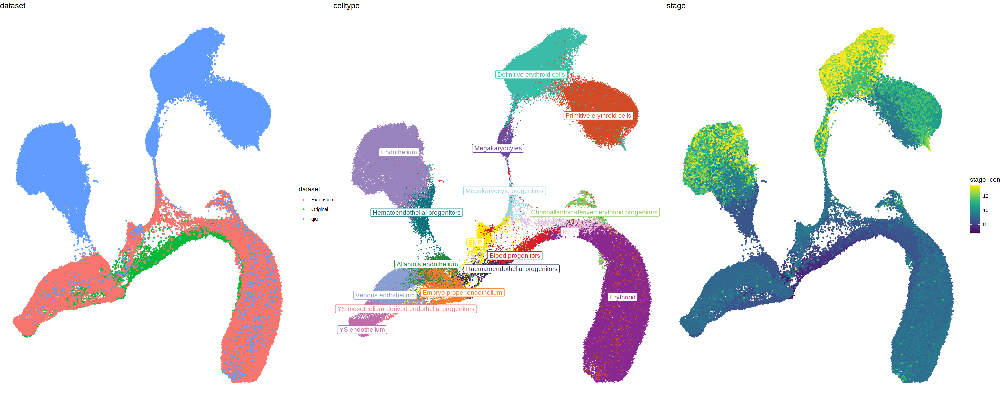

In [38]:
umap.dt$stage_cont = as.numeric(gsub('E', '', umap.dt$stage))

p1 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=dataset)) + 
    geom_point(size=0.5) + 
    ggtitle('dataset') + 
    theme_void() 

labels = umap.dt %>% 
    .[,`:=`(medianX=median(UMAP1), medianY=median(UMAP2)), by='celltype'] %>%
    unique(by='celltype')

p2 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=celltype)) + 
    geom_point(size=0.) + 
    scale_colour_manual(values = celltype_pallet) + 
    geom_label_repel(data=labels, 
                             aes(medianX, medianY, label=celltype),
                            #col='black',
                            size=4,
                            max.overlaps=Inf) +
    ggtitle('celltype') + 
    theme_void() + theme(legend.position='none')

p3 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=stage_cont)) + 
    geom_point(size=0.5) + 
    viridis::scale_color_viridis() + 
    ggtitle('stage') + 
    theme_void() 

options(repr.plot.width=25, repr.plot.height=10) 
ggarrange(p1,p2,p3, ncol=3)

In [45]:
summary(umap.dt$cell == colnames(sce))

   Mode   FALSE    TRUE 
logical  137670       4 

In [46]:
umap.dt = umap.dt[match(colnames(sce), umap.dt$cell)]

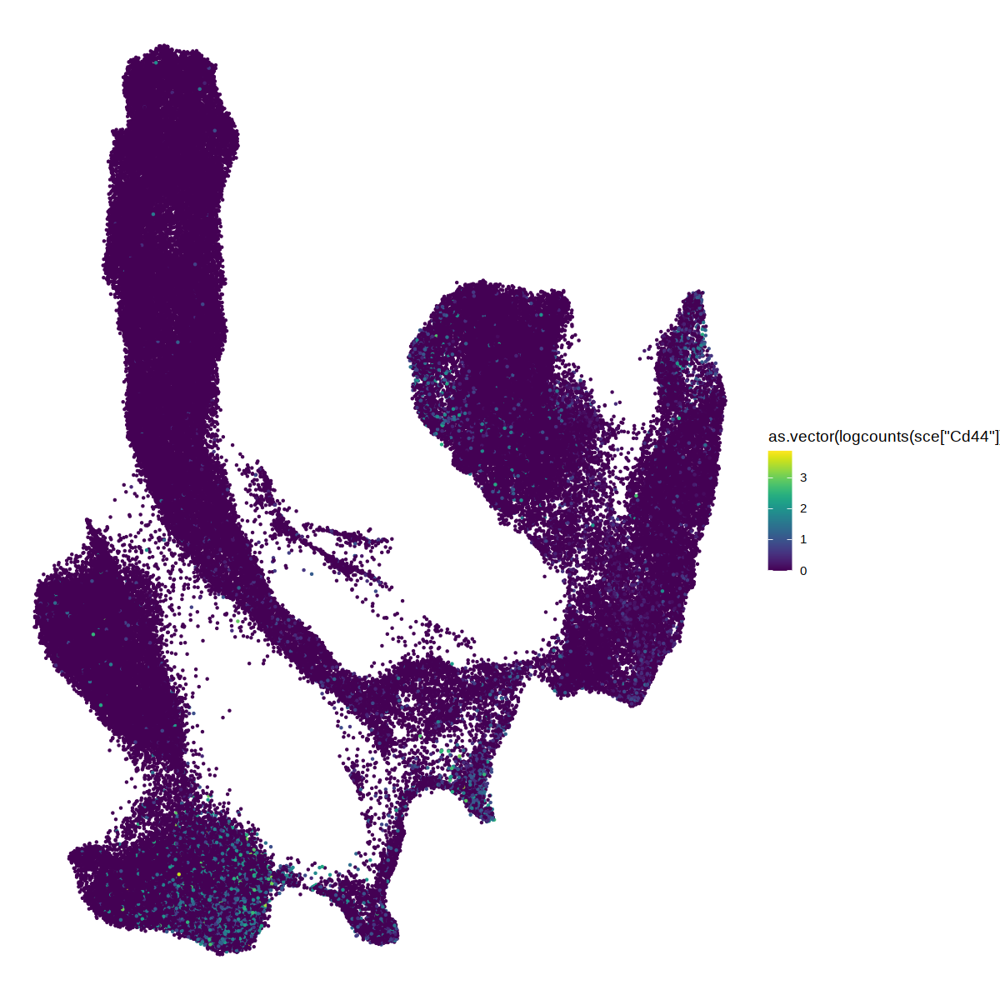

In [47]:
options(repr.plot.width=10, repr.plot.height=10) 

ggplot(umap.dt, aes(UMAP1, UMAP2, col=as.vector(logcounts(sce['Cd44'])))) + 
    geom_point(size=0.2, alpha=1) + 
    viridis::scale_color_viridis() +
    theme_void() 

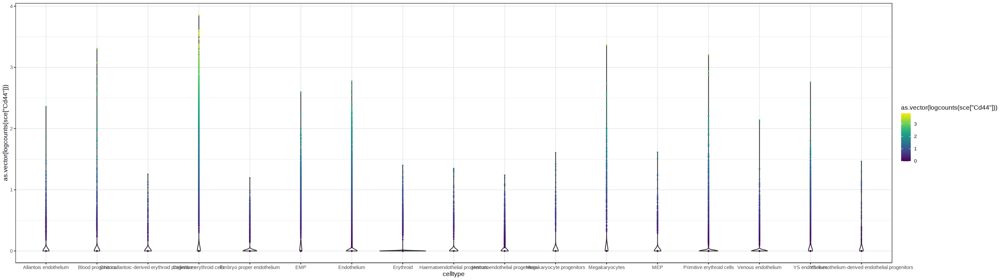

In [52]:
options(repr.plot.width=25, repr.plot.height=7) 

ggplot(umap.dt, aes(celltype, as.vector(logcounts(sce['Cd44'])), col=as.vector(logcounts(sce['Cd44'])))) + 
    geom_violin() + 
    geom_point(size=0.2, alpha=1) + 
    viridis::scale_color_viridis() +
    theme_bw() 

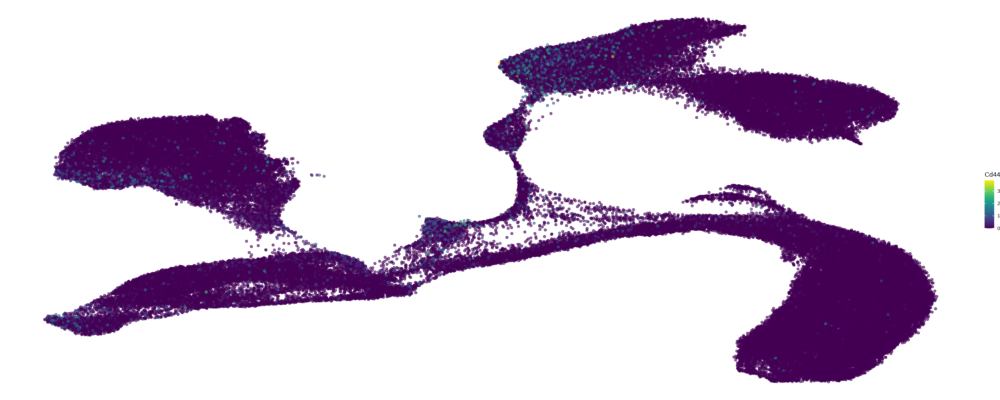

In [42]:
plotReducedDim(sce, dimred='UMAP_sample_stage', by_exprs_values= 'logcounts', colour_by='Cd44') + theme_void()

In [39]:
# Correct between the datasets, with the previous corrected PCAs as input
# note: this is agnostic of the E8.5 and E9.5 anchor points between the datasets
correct = reducedDim(sce, "PCA_sample_stage")

pc_list    <- lapply(unique(meta$dataset), function(ds){
    sub_pc   <- correct[meta$dataset == ds, , drop = FALSE]
    return(sub_pc)
})
names(pc_list) <- unique(meta$dataset)      

order_list = rev(sort(sapply(pc_list, nrow)))
pc_list = pc_list[names(order_list)]

correct = do.call(reducedMNN, c(pc_list, BPPARAM = mcparam))$corrected


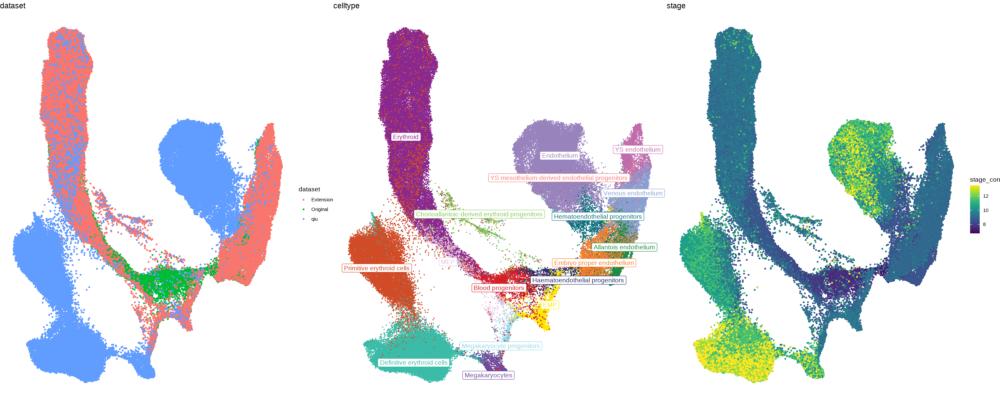

In [40]:

correct = correct[match(colnames(sce), rownames(correct)),]

reducedDim(sce, "PCA_sample_stage_dataset") = correct

sce <- runUMAP(sce, dimred="PCA_sample_stage_dataset", n_neighbors = 40, min_dist = 0.3, name='PCA_sample_stage_dataset')

umap.dt <- reducedDim(sce,"PCA_sample_stage_dataset") %>% as.data.table(keep.rownames=T) %>% 
  setnames(c("cell","UMAP1","UMAP2")) %>%
    merge(meta, by='cell')

umap.dt$stage_cont = as.numeric(gsub('E', '', umap.dt$stage))

p1 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=dataset)) + 
    geom_point(size=0.5) + 
    ggtitle('dataset') + 
    theme_void() 

labels = umap.dt %>% 
    .[,`:=`(medianX=median(UMAP1), medianY=median(UMAP2)), by='celltype'] %>%
    unique(by='celltype')

p2 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=celltype)) + 
    geom_point(size=0.) + 
    scale_colour_manual(values = celltype_pallet) + 
    geom_label_repel(data=labels, 
                             aes(medianX, medianY, label=celltype),
                            #col='black',
                            size=4,
                            max.overlaps=Inf) +
    ggtitle('celltype') + 
    theme_void() + theme(legend.position='none')

p3 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=stage_cont)) + 
    geom_point(size=0.5) + 
    viridis::scale_color_viridis() + 
    ggtitle('stage') + 
    theme_void() 

options(repr.plot.width=25, repr.plot.height=10) 
ggarrange(p1,p2,p3, ncol=3)